In [1]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=False)

Mounted at /content/drive/


## Setup

In [2]:
# ===============================================================
# GPU CLEANUP
# ===============================================================

for name in dir():
    if not name.startswith("_"):
        del globals()[name]
import gc
gc.collect()
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()
    print("GPU memory flushed")
    print("GPU:", torch.cuda.get_device_name(0))
    print(f"Total VRAM: {torch.cuda.get_device_properties(0).total_memory/1024**3:.2f} GB")
    print("Active CUDA memory:", torch.cuda.memory_allocated()/1024**2, "MB")
else:
    print("CUDA not available")

CUDA not available


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from pandas.api.types import is_numeric_dtype

In [4]:
import random

def seed_everything(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

seed_everything(42)

# Device selection: MPS (Apple Silicon) / CUDA / CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print("Device:", device)

Device: cpu


In [5]:
# ===============================================================
# CELL 4 - SETUP FOR student_mental_health_burnout_1M (NUMERIC ONLY)
# ===============================================================

# 1) Load dataset
# csv_path_1m = "student_mental_health_burnout_1M.csv"
csv_path_1m = "/content/drive/MyDrive/student_mental_health_burnout_1M.csv"
df_1m = pd.read_csv(csv_path_1m)

# 2) Detect and exclude target from PCA
target_candidates = ["dropout_risk", "risk_level", "burnout_level"]
target_col = next((col for col in target_candidates if col in df_1m.columns), None)

if target_col is None:
    raise ValueError(f"Nessuna target trovata tra {target_candidates}. Colonne disponibili: {list(df_1m.columns)}")

X_full = df_1m.drop(columns=[target_col]).copy()
y_target = df_1m[target_col].copy()

# 3) Keep only numeric features for PCA (remove all categoricals)
numeric_cols = [col for col in X_full.columns if is_numeric_dtype(X_full[col])]
X_numeric = X_full[numeric_cols].copy()

# 4) Train/test split
stratify_target = y_target if y_target.nunique(dropna=True) <= 20 else None
X_train_num, X_test_num, y_train, y_test = train_test_split(
    X_numeric, y_target, test_size=0.2, random_state=42, stratify=stratify_target
)

# 5) Numeric preprocessing for PCA
preprocessor_num = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scale", StandardScaler())
])

print("Dataset:", df_1m.shape)
print("Target excluded from PCA:", target_col)
print("Train/Test:", X_train_num.shape, X_test_num.shape)
print("Numeric features used in PCA:", len(numeric_cols))

Dataset: (1000000, 20)
Target excluded from PCA: dropout_risk
Train/Test: (800000, 17) (200000, 17)
Numeric features used in PCA: 17


## PCA

Input dimensions for PCA block: 17
N components for 90% variance: 10
Final cumulative variance at n=10: 0.9108


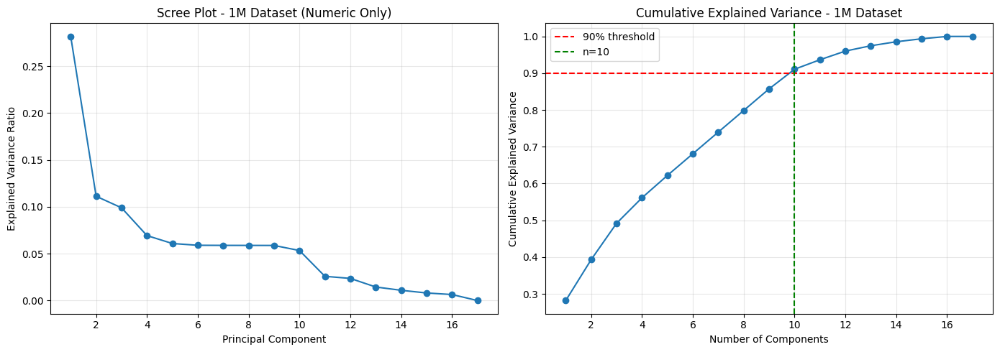

In [6]:
# ===============================================================
# CELL 5 - PCA FIT + EXPLAINED VARIANCE (NUMERIC ONLY)
# ===============================================================

# Fit preprocessing on train only
X_train_num_prepared = preprocessor_num.fit_transform(X_train_num)

# Fit PCA with all available components
pca_full_1m = PCA(random_state=42)
pca_full_1m.fit(X_train_num_prepared)

explained_var_1m = pca_full_1m.explained_variance_ratio_
cum_explained_var_1m = np.cumsum(explained_var_1m)

# Choose minimum number of components to explain at least 90% variance
var_threshold_1m = 0.90
n_components_95_1m = int(np.argmax(cum_explained_var_1m >= var_threshold_1m) + 1)

print("Input dimensions for PCA block:", X_train_num_prepared.shape[1])
print(f"N components for {int(var_threshold_1m*100)}% variance: {n_components_95_1m}")
print(f"Final cumulative variance at n={n_components_95_1m}: {cum_explained_var_1m[n_components_95_1m-1]:.4f}")

# Scree and cumulative variance plots
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

ax[0].plot(range(1, len(explained_var_1m) + 1), explained_var_1m, marker="o")
ax[0].set_title("Scree Plot - 1M Dataset (Numeric Only)")
ax[0].set_xlabel("Principal Component")
ax[0].set_ylabel("Explained Variance Ratio")
ax[0].grid(alpha=0.3)

ax[1].plot(range(1, len(cum_explained_var_1m) + 1), cum_explained_var_1m, marker="o")
ax[1].axhline(var_threshold_1m, color="red", linestyle="--", label=f"{int(var_threshold_1m*100)}% threshold")
ax[1].axvline(n_components_95_1m, color="green", linestyle="--", label=f"n={n_components_95_1m}")
ax[1].set_title("Cumulative Explained Variance - 1M Dataset")
ax[1].set_xlabel("Number of Components")
ax[1].set_ylabel("Cumulative Explained Variance")
ax[1].legend()
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [7]:
# ===============================================================
# CELL 7 (SETUP) - Preprocessing + PCA-10 for combined model
# ===============================================================
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import xgboost as xgb

# Re-use the same numeric_cols already defined in Cell 4
X_train_full = X_full.loc[X_train_num.index].copy()
X_test_full  = X_full.loc[X_test_num.index].copy()

y_train_continuous = y_target.loc[X_train_num.index].copy()
y_test_continuous  = y_target.loc[X_test_num.index].copy()

num_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

X_train_num_processed = num_transformer.fit_transform(X_train_full[numeric_cols])
X_test_num_processed  = num_transformer.transform(X_test_full[numeric_cols])

pca_10 = PCA(n_components=10, random_state=42)
X_train_pca_10 = pca_10.fit_transform(X_train_num_processed)
X_test_pca_10  = pca_10.transform(X_test_num_processed)

print(f"PCA-10 explained variance: {np.sum(pca_10.explained_variance_ratio_):.4f}")

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.1, 0.3],
    }

def compute_adjusted_r2(y_true, y_pred, n_features):
    n  = len(y_true)
    r2 = r2_score(y_true, y_pred)
    return 1 - (1 - r2) * (n - 1) / (n - n_features - 1)

cv = KFold(n_splits=5, shuffle=True, random_state=42)
print("Setup complete.")


PCA-10 explained variance: 0.9108
Setup complete.


Correlation Matrix Shape: (11, 11)

Correlation Matrix (PC1-PC4 + Selected Features):


KeyError: 'In'

,PC1,PC2,PC3,PC4,academic_performance,financial_stress,family_expectation,physical_activity,sleep_hours,academic_year,age
PC1,1.000,0.000,-0.000,-0.000,-0.127,-0.432,-0.319,0.161,0.291,-0.001,0.002
PC2,0.000,1.000,-0.000,0.000,-0.006,-0.002,0.003,0.002,-0.004,0.001,0.003
PC3,-0.000,-0.000,1.000,0.000,0.538,-0.319,-0.235,0.120,0.195,-0.001,0.000
PC4,-0.000,0.000,0.000,1.000,-0.039,0.225,0.170,-0.072,0.044,-0.002,-0.004
academic_performance,-0.127,-0.006,0.538,-0.039,1.000,0.000,-0.001,-0.001,-0.002,-0.000,0.001
financial_stress,-0.432,-0.002,-0.319,0.225,0.000,1.000,-0.001,-0.001,0.000,-0.001,-0.001
family_expectation,-0.319,0.003,-0.235,0.170,-0.001,-0.001,1.000,0.001,-0.000,0.000,-0.001
physical_activity,0.161,0.002,0.120,-0.072,-0.001,-0.001,0.001,1.000,-0.000,-0.000,0.000
sleep_hours,0.291,-0.004,0.195,0.044,-0.002,0.000,-0.000,-0.000,1.000,-0.002,-0.001
academic_year,-0.001,0.001,-0.001,-0.002,-0.000,-0.001,0.000,-0.000,-0.002,1.000,0.000


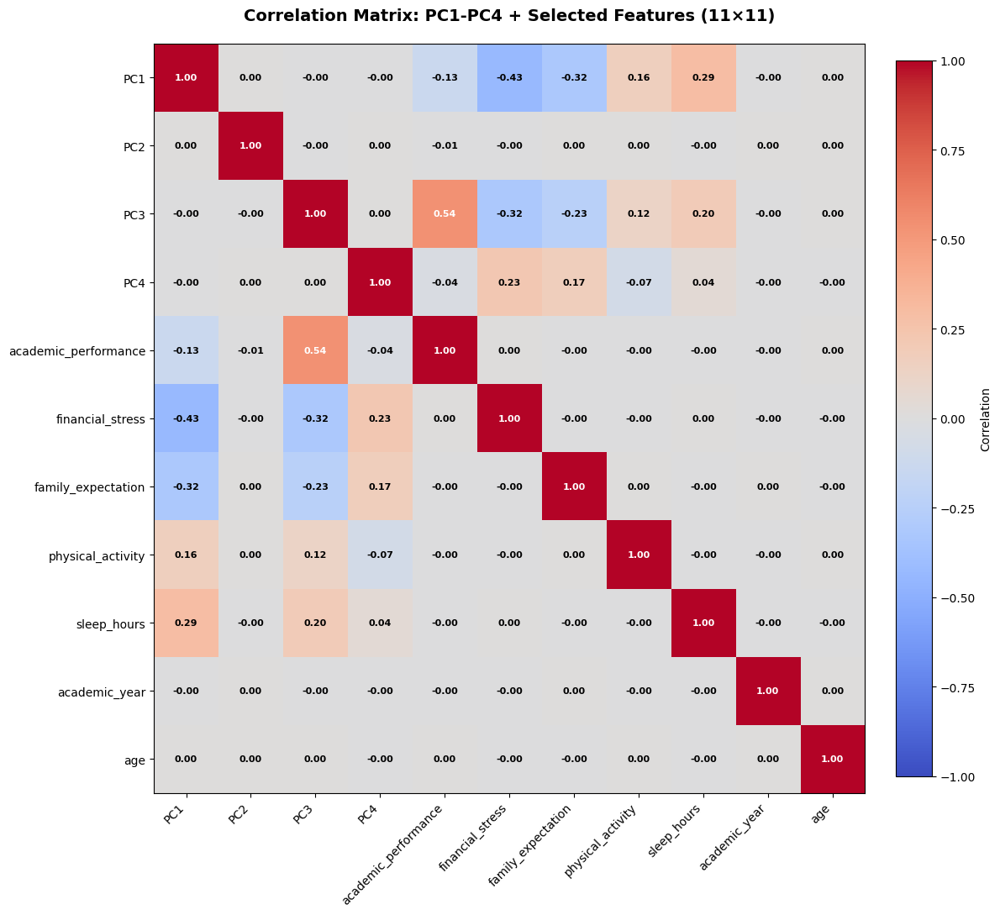

In [8]:
# Feature names for the correlation matrix
selected_features = ["academic_performance", "financial_stress", "family_expectation", "physical_activity", "sleep_hours", "academic_year", "age"]
pc_names = ['PC1', 'PC2', 'PC3', 'PC4']

# Extract PC1, PC2, PC3, PC4 from the 10-PC PCA (first 4 components)
X_train_selected_pcs = X_train_pca_10[:, :4]  # Get PC1-PC4

# Extract the selected numeric features (with preprocessing)
X_train_selected_num = num_transformer.fit_transform(X_train_full[selected_features])

# Combine PCs and numeric features into one DataFrame
combined_data = np.hstack([X_train_selected_pcs, X_train_selected_num])
all_feature_names = pc_names + selected_features
combined_df = pd.DataFrame(combined_data, columns=all_feature_names)

# Calculate correlation matrix
corr_matrix = combined_df.corr()
print("Correlation Matrix Shape:", corr_matrix.shape)
print("\nCorrelation Matrix (PC1-PC4 + Selected Features):")
display(corr_matrix.round(3))

# Plot correlation matrix
fig, ax = plt.subplots(figsize=(12, 11))
im = ax.imshow(corr_matrix.values, cmap="coolwarm", vmin=-1, vmax=1, aspect="auto")
cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Correlation")

# Set ticks and labels
ax.set_xticks(range(len(all_feature_names)))
ax.set_yticks(range(len(all_feature_names)))
ax.set_xticklabels(all_feature_names, rotation=45, ha='right')
ax.set_yticklabels(all_feature_names)

# Add correlation values as text annotations
for i in range(len(all_feature_names)):
    for j in range(len(all_feature_names)):
        value = corr_matrix.iloc[i, j]
        text_color = "black" if abs(value) < 0.5 else "white"
        ax.text(j, i, f"{value:.2f}", ha="center", va="center",
                color=text_color, fontsize=8, fontweight='bold')

ax.set_title("Correlation Matrix: PC1-PC4 + Selected Features (11×11)", fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

## XGBoost Regression + Feature Selection

In [9]:
# ===============================================================
# CELL 8 - XGBOOST REGRESSION WITHOUT PCA + GRID SEARCH
# ===============================================================

print("\n" + "=" * 70)
print("XGBoost Regression: All Numeric Features (NO PCA)")
print("=" * 70)

# 1) Use raw numeric features (no PCA)
sample_idx = X_train_full.sample(n=50000, random_state=42).index

X_train_sample = X_train_full.loc[sample_idx]
y_train_continuous_tune = y_train_continuous.loc[sample_idx]

X_train_num_no_pca = num_transformer.fit_transform(
    X_train_sample[numeric_cols]
)
X_test_num_no_pca = num_transformer.transform(X_test_full[numeric_cols])

y_train_log = np.log1p(y_train_continuous_tune)

print(f"\nFeatures (no PCA):")
print(f"  Train shape: {X_train_num_no_pca.shape}")
print(f"  Test shape: {X_test_num_no_pca.shape}")
print(f"  Using all {X_train_num_no_pca.shape[1]} numeric features")


XGBoost Regression: All Numeric Features (NO PCA)

Features (no PCA):
  Train shape: (50000, 17)
  Test shape: (200000, 17)
  Using all 17 numeric features


In [38]:
# # 2) Define XGBoost Regressor
# xgb_reg_no_pca = xgb.XGBRegressor(
#     objective='reg:squarederror',
#     random_state=42,
#     n_jobs=-1,
# )

# # 3) Grid Search
# print("\n" + "=" * 70)
# print("Grid Search: Hyperparameter Tuning (NO PCA)")
# print("=" * 70)

# param_grid = {
#     'max_depth': [3, 6, 8],
#     'learning_rate': [0.01, 0.05, 0.1],
#     'n_estimators': [500, 1000],
#     'subsample': [0.7, 0.9],
#     'colsample_bytree': [0.7, 0.9]
# }

# grid_search_no_pca = GridSearchCV(
#     estimator=xgb_reg_no_pca,
#     param_grid=param_grid,
#     cv=cv,
#     scoring='r2',
#     n_jobs=-1,
#     verbose=1
# )

# print("Starting grid search...")

# grid_search_no_pca.fit(X_train_num_no_pca, y_train_log)

# print(f"\nBest parameters: {grid_search_no_pca.best_params_}")
# print(f"Best R² (CV): {grid_search_no_pca.best_score_:.4f}")

# # Extract best model
# best_xgb_reg_no_pca = grid_search_no_pca.best_estimator_

# # Get CV scores for best model
# best_scores_r2_no_pca = cross_val_score(
#     estimator=best_xgb_reg_no_pca,
#     X=X_train_num_no_pca,
#     y=y_train_log,
#     cv=cv,
#     scoring='r2',
#     n_jobs=-1
# )

# best_scores_mae_no_pca = cross_val_score(
#     estimator=best_xgb_reg_no_pca,
#     X=X_train_num_no_pca,
#     y=y_train_log,
#     cv=cv,
#     scoring='neg_mean_absolute_error',
#     n_jobs=-1
# )

# def scorer_adj_r2_no_pca(estimator, X, y):
#     y_pred = estimator.predict(X)
#     return compute_adjusted_r2(y, y_pred, X.shape[1])

# best_scores_adj_r2_no_pca = cross_val_score(
#     estimator=best_xgb_reg_no_pca,
#     X=X_train_num_no_pca,
#     y=y_train_log,
#     cv=cv,
#     scoring=scorer_adj_r2_no_pca,
#     n_jobs=-1
# )

# mean_r2_no_pca = np.mean(best_scores_r2_no_pca)
# std_r2_no_pca = np.std(best_scores_r2_no_pca)
# mean_mae_no_pca = -np.mean(best_scores_mae_no_pca)
# std_mae_no_pca = np.std(best_scores_mae_no_pca)
# mean_adj_r2_no_pca = np.mean(best_scores_adj_r2_no_pca)
# std_adj_r2_no_pca = np.std(best_scores_adj_r2_no_pca)

# print(f"\nBest Model Cross-Validation Results (5-Fold):")
# print(f"R² Score:           {mean_r2_no_pca:.4f} (±{std_r2_no_pca:.4f})")
# print(f"MAE:                {mean_mae_no_pca:.4f} (±{std_mae_no_pca:.4f})")
# print(f"Adjusted R² Score:  {mean_adj_r2_no_pca:.4f} (±{std_adj_r2_no_pca:.4f})")


Grid Search: Hyperparameter Tuning (NO PCA)
Starting grid search...
Fitting 5 folds for each of 72 candidates, totalling 360 fits

Best parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 500, 'subsample': 0.7}
Best R² (CV): 0.6034

Best Model Cross-Validation Results (5-Fold):
R² Score:           0.6034 (±0.0058)
MAE:                0.2860 (±0.0013)
Adjusted R² Score:  0.6027 (±0.0058)



Starting grid search...
Fitting 5 folds for each of 72 candidates, totalling 360 fits

**Best parameters**: {'colsample_bytree': 0.9, 'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 500, 'subsample': 0.7}

Best R² (CV): 0.6034

Best Model Cross-Validation Results (5-Fold):
- R² Score:           0.6034 (±0.0058)
- MAE:                0.2860 (±0.0013)
- Adjusted R² Score:  0.6027 (±0.0058)


In [10]:
best_xgb_reg_no_pca = xgb.XGBRegressor(   # based on the results of grid search (all numerical features)
    objective='reg:squarederror',
    colsample_bytree=0.9,
    learning_rate=0.01,
    max_depth=6,
    n_estimators=500,
    subsample=0.7,
    random_state=42,
    n_jobs=-1,
)


Test Set Evaluation (Best Model - NO PCA)
Mean Squared Error (MSE):         0.6841
Root Mean Squared Error (RMSE):   0.8271
Mean Absolute Error (MAE):        0.6224
R² Score:                         0.6214
Adjusted R² Score:                0.6214


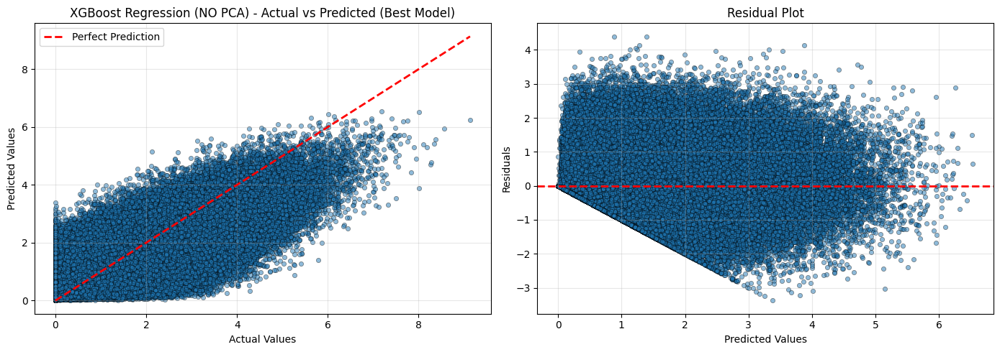


Top 20 Feature Importances (NO PCA)
             feature  importance
       burnout_score    0.622412
    depression_score    0.247339
      social_support    0.045061
    financial_stress    0.044300
 mental_health_index    0.027994
        stress_level    0.002183
       exam_pressure    0.001310
       anxiety_score    0.001060
  family_expectation    0.001034
         sleep_hours    0.000999
         screen_time    0.000967
      internet_usage    0.000965
academic_performance    0.000963
 study_hours_per_day    0.000957
   physical_activity    0.000937
       academic_year    0.000778
                 age    0.000741


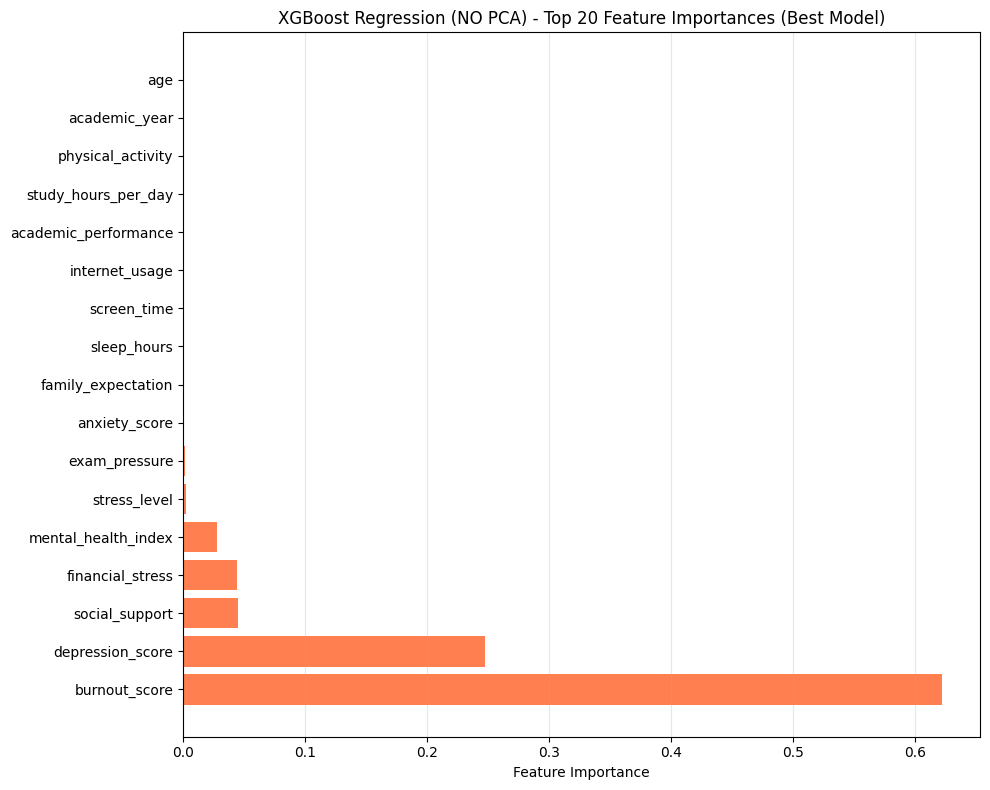


✓ XGBoost regression without PCA and grid search complete!


In [12]:
# 4) Fit best model on full training set
X_train_num_no_pca_full = num_transformer.fit_transform(
    X_train_full[numeric_cols]
)
y_train_log_full = np.log1p(y_train_continuous)
best_xgb_reg_no_pca.fit(X_train_num_no_pca_full, y_train_log_full)

# 5) Evaluate on test set
y_test_pred_log1p = best_xgb_reg_no_pca.predict(X_test_num_no_pca)
y_test_pred_no_pca = np.expm1(y_test_pred_log1p)

test_mse_no_pca = mean_squared_error(y_test_continuous, y_test_pred_no_pca)
test_rmse_no_pca = np.sqrt(test_mse_no_pca)
test_mae_no_pca = mean_absolute_error(y_test_continuous, y_test_pred_no_pca)
test_r2_no_pca = r2_score(y_test_continuous, y_test_pred_no_pca)
test_adj_r2_no_pca = compute_adjusted_r2(y_test_continuous, y_test_pred_no_pca, X_test_num_no_pca.shape[1])

# 6) Display test set results
print("\n" + "=" * 70)
print("Test Set Evaluation (Best Model - NO PCA)")
print("=" * 70)
print(f"Mean Squared Error (MSE):         {test_mse_no_pca:.4f}")
print(f"Root Mean Squared Error (RMSE):   {test_rmse_no_pca:.4f}")
print(f"Mean Absolute Error (MAE):        {test_mae_no_pca:.4f}")
print(f"R² Score:                         {test_r2_no_pca:.4f}")
print(f"Adjusted R² Score:                {test_adj_r2_no_pca:.4f}")

# 7) Visualizations
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Actual vs Predicted
axes[0].scatter(y_test_continuous, y_test_pred_no_pca, alpha=0.5, s=20, edgecolors='k', linewidth=0.5)
axes[0].plot([y_test_continuous.min(), y_test_continuous.max()],
             [y_test_continuous.min(), y_test_continuous.max()],
             'r--', lw=2, label='Perfect Prediction')
axes[0].set_xlabel('Actual Values')
axes[0].set_ylabel('Predicted Values')
axes[0].set_title('XGBoost Regression (NO PCA) - Actual vs Predicted (Best Model)')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Residual plot
residuals_no_pca = y_test_continuous.values - y_test_pred_no_pca
axes[1].scatter(y_test_pred_no_pca, residuals_no_pca, alpha=0.5, s=20, edgecolors='k', linewidth=0.5)
axes[1].axhline(y=0, color='r', linestyle='--', lw=2)
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residuals')
axes[1].set_title('Residual Plot')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# 8) Feature importance (top 20)
feature_importance_no_pca = best_xgb_reg_no_pca.feature_importances_
feature_names_all = list(numeric_cols)

feature_importance_df_no_pca = pd.DataFrame({
    'feature': feature_names_all,
    'importance': feature_importance_no_pca
}).sort_values('importance', ascending=False)

print("\n" + "=" * 70)
print("Top 20 Feature Importances (NO PCA)")
print("=" * 70)
print(feature_importance_df_no_pca.head(20).to_string(index=False))

# 9) Plot feature importance
fig, ax = plt.subplots(figsize=(10, 8))
top_features_no_pca = feature_importance_df_no_pca.head(20)
ax.barh(top_features_no_pca['feature'], top_features_no_pca['importance'], color='coral')
ax.set_xlabel('Feature Importance')
ax.set_title('XGBoost Regression (NO PCA) - Top 20 Feature Importances (Best Model)')
ax.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Store CV scores for later comparison
# no_pca_cv_scores_r2 = best_scores_r2_no_pca

print("\n✓ XGBoost regression without PCA and grid search complete!")

In [13]:
feature_names = num_transformer.get_feature_names_out(numeric_cols).tolist()
print(len(feature_names))

17


f15    784.278015
f7     311.662964
f10     56.779682
f13     55.820362
f16     35.273609
f5       2.750454
f3       1.651026
f6       1.335057
f14      1.302361
f8       1.258890
f11      1.218878
f12      1.215839
f4       1.213052
f2       1.206430
f9       1.180193
f1       0.980638
f0       0.934327
Name: gain, dtype: float64
burnout_score           0.232840
depression_score        0.121409
social_support          0.099855
financial_stress        0.099519
mental_health_index     0.004014
anxiety_score           0.000794
stress_level            0.000488
family_expectation      0.000355
exam_pressure           0.000309
sleep_hours             0.000210
study_hours_per_day     0.000194
academic_performance    0.000161
physical_activity       0.000158
internet_usage          0.000115
screen_time             0.000090
academic_year           0.000086
age                     0.000060
dtype: float32


/tmp/ipykernel_4522/101796811.py:20: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_train_num_no_pca, feature_names=feature_names)


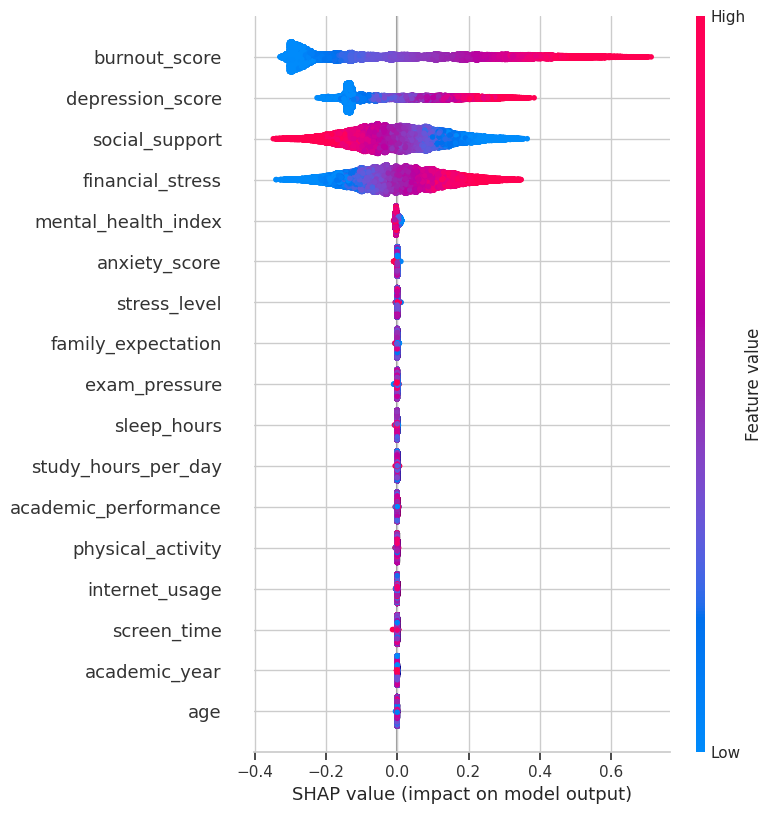

In [48]:
# # Gain importance
# gain_importance = pd.Series(
#     best_xgb_reg_no_pca.get_booster().get_score(importance_type='gain'),
#     name='gain'
# ).sort_values(ascending=False)
# print(gain_importance)

# # SHAP
# import shap

# explainer = shap.TreeExplainer(best_xgb_reg_no_pca)
# shap_values = explainer(X_train_num_no_pca)

# mean_abs_shap = pd.Series(
#     np.abs(shap_values.values).mean(axis=0),
#     index=feature_names
# ).sort_values(ascending=False)
# print(mean_abs_shap)

# shap.summary_plot(shap_values, X_train_num_no_pca, feature_names=feature_names)

Shap results:

Name: gain, dtype: float64

- burnout_score           0.232840
- depression_score        0.121409
- social_support          0.099855
- financial_stress        0.099519
- mental_health_index     0.004014
- anxiety_score           0.000794
- stress_level            0.000488
- family_expectation      0.000355
- exam_pressure           0.000309
- sleep_hours             0.000210
- study_hours_per_day     0.000194
- academic_performance    0.000161
- physical_activity       0.000158
- internet_usage          0.000115
- screen_time             0.000090
- academic_year           0.000086
- age                     0.000060

dtype: float32

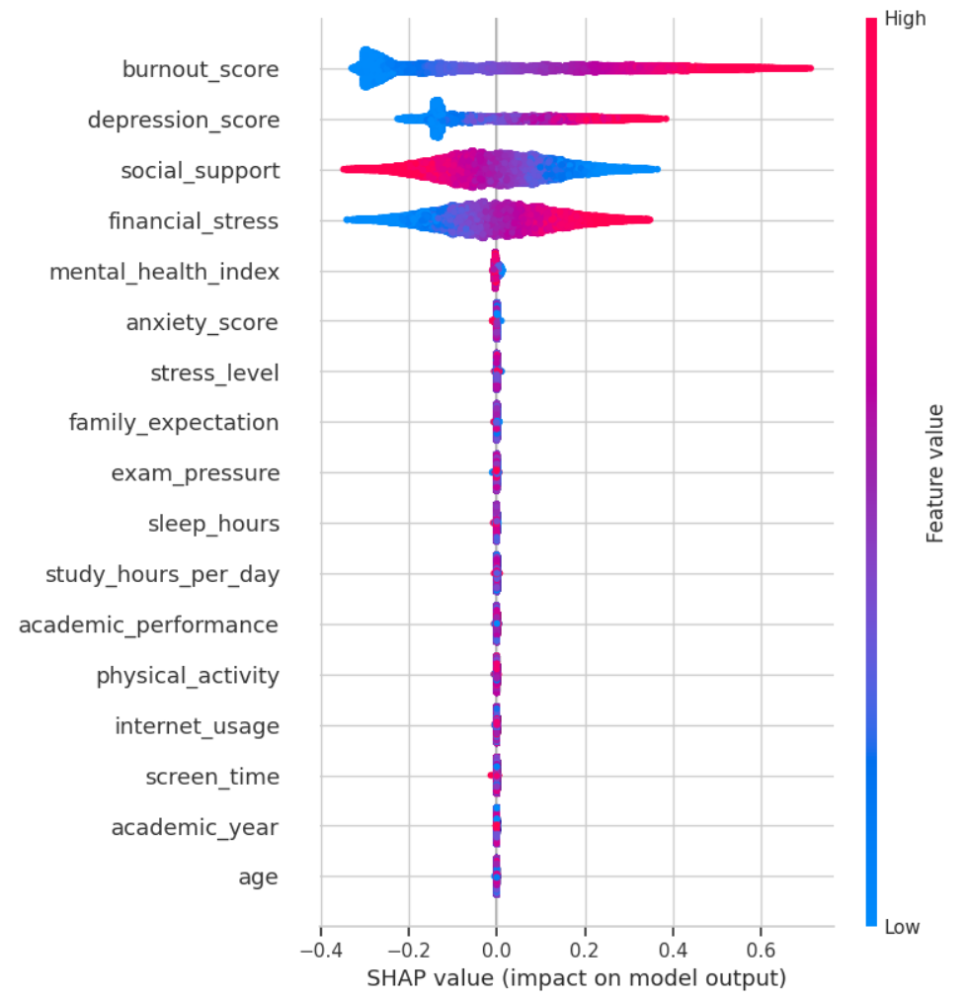

In [14]:
# ==== ONLY THE 4 MOST IMPORTANT FEATURES ==== #

# 1) Use raw numeric features (no PCA)
important_features = ['burnout_score', 'depression_score', 'social_support', 'financial_stress']
X_selected = X_train_full[important_features]
sample_idx = X_selected.sample(n=50000, random_state=42).index

X_train_sample = X_selected.loc[sample_idx]
y_train_continuous_tune = y_train_continuous.loc[sample_idx]

X_train_num_no_pca = num_transformer.fit_transform(
    X_train_sample
)
X_test_num_no_pca = num_transformer.transform(X_selected)

y_train_log = np.log1p(y_train_continuous_tune)

print(f"\nFeatures (no PCA):")
print(f"  Train shape: {X_train_num_no_pca.shape}")
print(f"  Test shape: {X_test_num_no_pca.shape}")
print(f"  Using all {X_train_num_no_pca.shape[1]} numeric features")


Features (no PCA):
  Train shape: (50000, 4)
  Test shape: (800000, 4)
  Using all 4 numeric features


In [55]:
# # 2) Define XGBoost Regressor
# xgb_reg_no_pca = xgb.XGBRegressor(
#     objective='reg:squarederror',
#     random_state=42,
#     n_jobs=-1,
# )

# # 3) Grid Search
# print("\n" + "=" * 70)
# print("Grid Search: Hyperparameter Tuning (NO PCA)")
# print("=" * 70)

# param_grid = {
#     'max_depth': [3, 6, 8],
#     'learning_rate': [0.01, 0.05, 0.1],
#     'n_estimators': [500, 1000],
#     'subsample': [0.7, 0.9],
#     'colsample_bytree': [0.7, 0.9]
# }

# grid_search_no_pca = GridSearchCV(
#     estimator=xgb_reg_no_pca,
#     param_grid=param_grid,
#     cv=cv,
#     scoring='r2',
#     n_jobs=-1,
#     verbose=1
# )

# print("Starting grid search...")

# grid_search_no_pca.fit(X_train_num_no_pca, y_train_log)

# print(f"\nBest parameters: {grid_search_no_pca.best_params_}")
# print(f"Best R² (CV): {grid_search_no_pca.best_score_:.4f}")

# # Extract best model
# best_xgb_reg_no_pca = grid_search_no_pca.best_estimator_

# # Get CV scores for best model
# best_scores_r2_no_pca = cross_val_score(
#     estimator=best_xgb_reg_no_pca,
#     X=X_train_num_no_pca,
#     y=y_train_log,
#     cv=cv,
#     scoring='r2',
#     n_jobs=-1
# )

# best_scores_mae_no_pca = cross_val_score(
#     estimator=best_xgb_reg_no_pca,
#     X=X_train_num_no_pca,
#     y=y_train_log,
#     cv=cv,
#     scoring='neg_mean_absolute_error',
#     n_jobs=-1
# )

# def scorer_adj_r2_no_pca(estimator, X, y):
#     y_pred = estimator.predict(X)
#     return compute_adjusted_r2(y, y_pred, X.shape[1])

# best_scores_adj_r2_no_pca = cross_val_score(
#     estimator=best_xgb_reg_no_pca,
#     X=X_train_num_no_pca,
#     y=y_train_log,
#     cv=cv,
#     scoring=scorer_adj_r2_no_pca,
#     n_jobs=-1
# )

# mean_r2_no_pca = np.mean(best_scores_r2_no_pca)
# std_r2_no_pca = np.std(best_scores_r2_no_pca)
# mean_mae_no_pca = -np.mean(best_scores_mae_no_pca)
# std_mae_no_pca = np.std(best_scores_mae_no_pca)
# mean_adj_r2_no_pca = np.mean(best_scores_adj_r2_no_pca)
# std_adj_r2_no_pca = np.std(best_scores_adj_r2_no_pca)

# print(f"\nBest Model Cross-Validation Results (5-Fold):")
# print(f"R² Score:           {mean_r2_no_pca:.4f} (±{std_r2_no_pca:.4f})")
# print(f"MAE:                {mean_mae_no_pca:.4f} (±{std_mae_no_pca:.4f})")
# print(f"Adjusted R² Score:  {mean_adj_r2_no_pca:.4f} (±{std_adj_r2_no_pca:.4f})")


Grid Search: Hyperparameter Tuning (NO PCA)
Starting grid search...
Fitting 5 folds for each of 72 candidates, totalling 360 fits

Best parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 0.7}
Best R² (CV): 0.6043

Best Model Cross-Validation Results (5-Fold):
R² Score:           0.6043 (±0.0061)
MAE:                0.2845 (±0.0014)
Adjusted R² Score:  0.6041 (±0.0061)


Starting grid search...

Fitting 5 folds for each of 72 candidates, totalling 360 fits

**Best parameters**: {'colsample_bytree': 0.9, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 0.7}

Best R² (CV): 0.6043

Best Model Cross-Validation Results (5-Fold):
- R² Score:           0.6043 (±0.0061)
- MAE:                0.2845 (±0.0014)
- Adjusted R² Score:  0.6041 (±0.0061)

In [15]:
X_train_num_no_pca_full = num_transformer.fit_transform(
    X_selected
)
X_test_num_no_pca = num_transformer.transform(X_test_full[important_features])
y_train_log_full = np.log1p(y_train_continuous)

print(X_train_num_no_pca_full.shape)
print(X_test_num_no_pca.shape)

(800000, 4)
(200000, 4)


In [16]:
best_xgb_reg_no_pca = xgb.XGBRegressor(   # based on the grid search results (only the 4 selected features)
    objective='reg:squarederror',
    colsample_bytree=0.9,
    learning_rate=0.01,
    max_depth=3,
    n_estimators=1000,
    subsample=0.7,
    random_state=42,
    n_jobs=-1,
)


Test Set Evaluation (Best Model - NO PCA)
Mean Squared Error (MSE):         0.6837
Root Mean Squared Error (RMSE):   0.8269
Mean Absolute Error (MAE):        0.6216
R² Score:                         0.6217
Adjusted R² Score:                0.6216


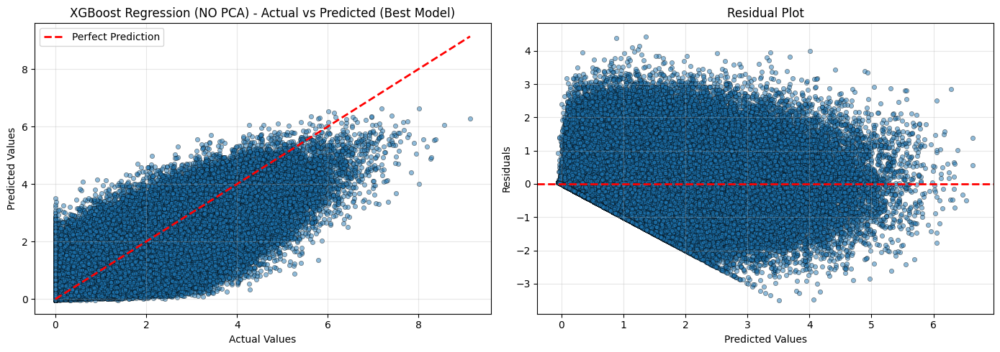

In [17]:
# 4) Fit best model on full training set
best_xgb_reg_no_pca.fit(X_train_num_no_pca_full, y_train_log_full)

# 5) Evaluate on test set
y_test_pred_log1p = best_xgb_reg_no_pca.predict(X_test_num_no_pca)
y_test_pred_no_pca = np.expm1(y_test_pred_log1p)

test_mse_no_pca = mean_squared_error(y_test_continuous, y_test_pred_no_pca)
test_rmse_no_pca = np.sqrt(test_mse_no_pca)
test_mae_no_pca = mean_absolute_error(y_test_continuous, y_test_pred_no_pca)
test_r2_no_pca = r2_score(y_test_continuous, y_test_pred_no_pca)
test_adj_r2_no_pca = compute_adjusted_r2(y_test_continuous, y_test_pred_no_pca, X_test_num_no_pca.shape[1])

# 6) Display test set results
print("\n" + "=" * 70)
print("Test Set Evaluation (Best Model - NO PCA)")
print("=" * 70)
print(f"Mean Squared Error (MSE):         {test_mse_no_pca:.4f}")
print(f"Root Mean Squared Error (RMSE):   {test_rmse_no_pca:.4f}")
print(f"Mean Absolute Error (MAE):        {test_mae_no_pca:.4f}")
print(f"R² Score:                         {test_r2_no_pca:.4f}")
print(f"Adjusted R² Score:                {test_adj_r2_no_pca:.4f}")

# 7) Visualizations
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Actual vs Predicted
axes[0].scatter(y_test_continuous, y_test_pred_no_pca, alpha=0.5, s=20, edgecolors='k', linewidth=0.5)
axes[0].plot([y_test_continuous.min(), y_test_continuous.max()],
             [y_test_continuous.min(), y_test_continuous.max()],
             'r--', lw=2, label='Perfect Prediction')
axes[0].set_xlabel('Actual Values')
axes[0].set_ylabel('Predicted Values')
axes[0].set_title('XGBoost Regression (NO PCA) - Actual vs Predicted (Best Model)')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Residual plot
residuals_no_pca = y_test_continuous.values - y_test_pred_no_pca
axes[1].scatter(y_test_pred_no_pca, residuals_no_pca, alpha=0.5, s=20, edgecolors='k', linewidth=0.5)
axes[1].axhline(y=0, color='r', linestyle='--', lw=2)
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residuals')
axes[1].set_title('Residual Plot')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## Random Forest


Test Set Evaluation (Best Model - NO PCA)
Mean Squared Error (MSE):         0.7032
Root Mean Squared Error (RMSE):   0.8386
Mean Absolute Error (MAE):        0.6325
R² Score:                         0.6109
Adjusted R² Score:                0.6109


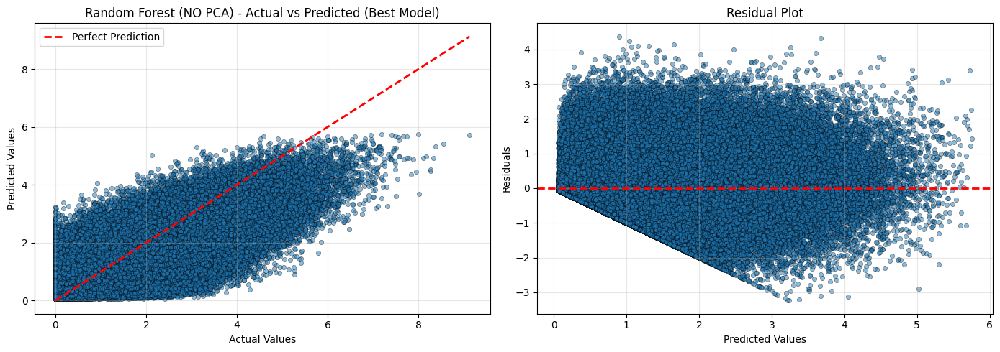

In [19]:
from sklearn.ensemble import RandomForestRegressor

# Model
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=8,
    max_features='sqrt',
    random_state=42
)

rf.fit(X_train_num_no_pca_full, y_train_log_full)

# 5) Evaluate on test set
y_test_pred_log1p = rf.predict(X_test_num_no_pca)
y_test_pred_no_pca = np.expm1(y_test_pred_log1p)

test_mse_no_pca = mean_squared_error(y_test_continuous, y_test_pred_no_pca)
test_rmse_no_pca = np.sqrt(test_mse_no_pca)
test_mae_no_pca = mean_absolute_error(y_test_continuous, y_test_pred_no_pca)
test_r2_no_pca = r2_score(y_test_continuous, y_test_pred_no_pca)
test_adj_r2_no_pca = compute_adjusted_r2(y_test_continuous, y_test_pred_no_pca, X_test_num_no_pca.shape[1])

# 6) Display test set results
print("\n" + "=" * 70)
print("Test Set Evaluation (Best Model - NO PCA)")
print("=" * 70)
print(f"Mean Squared Error (MSE):         {test_mse_no_pca:.4f}")
print(f"Root Mean Squared Error (RMSE):   {test_rmse_no_pca:.4f}")
print(f"Mean Absolute Error (MAE):        {test_mae_no_pca:.4f}")
print(f"R² Score:                         {test_r2_no_pca:.4f}")
print(f"Adjusted R² Score:                {test_adj_r2_no_pca:.4f}")

# 7) Visualizations
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Actual vs Predicted
axes[0].scatter(y_test_continuous, y_test_pred_no_pca, alpha=0.5, s=20, edgecolors='k', linewidth=0.5)
axes[0].plot([y_test_continuous.min(), y_test_continuous.max()],
             [y_test_continuous.min(), y_test_continuous.max()],
             'r--', lw=2, label='Perfect Prediction')
axes[0].set_xlabel('Actual Values')
axes[0].set_ylabel('Predicted Values')
axes[0].set_title('Random Forest (NO PCA) - Actual vs Predicted (Best Model)')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Residual plot
residuals_no_pca = y_test_continuous.values - y_test_pred_no_pca
axes[1].scatter(y_test_pred_no_pca, residuals_no_pca, alpha=0.5, s=20, edgecolors='k', linewidth=0.5)
axes[1].axhline(y=0, color='r', linestyle='--', lw=2)
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residuals')
axes[1].set_title('Residual Plot')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## Ridge Regression

In [20]:
# ==== RIDGE REGRESSION ====#

from sklearn.linear_model import RidgeCV

ridge_cv = RidgeCV(alphas=[0.001, 0.01, 0.1, 1.0, 10.0], cv=5)
ridge_cv.fit(X_train_num_no_pca_full, y_train_log_full)

print(f"Best alpha: {ridge_cv.alpha_}")
ridge = ridge_cv  # already fitted, use directly

Best alpha: 10.0



Test Set Evaluation (Best Model - NO PCA)
Mean Squared Error (MSE):         0.7273
Root Mean Squared Error (RMSE):   0.8528
Mean Absolute Error (MAE):        0.6393
R² Score:                         0.5976
Adjusted R² Score:                0.5975


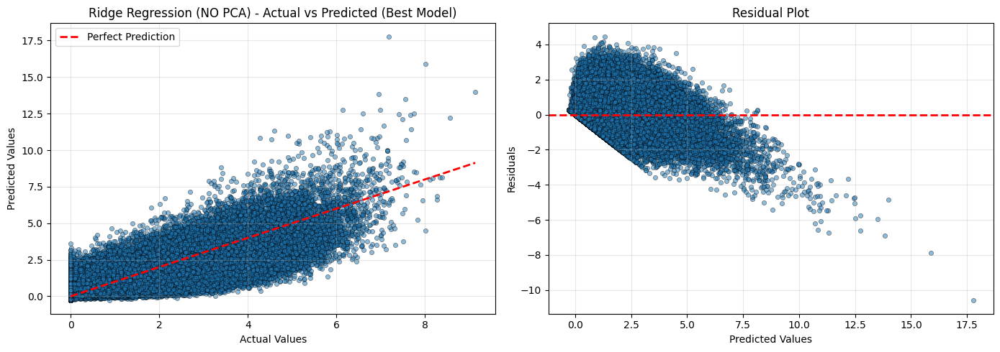

In [21]:
# 4) Fit best model on full training set
ridge.fit(X_train_num_no_pca_full, y_train_log_full)

# 5) Evaluate on test set
y_test_pred_log1p = ridge.predict(X_test_num_no_pca)
y_test_pred_no_pca = np.expm1(y_test_pred_log1p)

test_mse_no_pca = mean_squared_error(y_test_continuous, y_test_pred_no_pca)
test_rmse_no_pca = np.sqrt(test_mse_no_pca)
test_mae_no_pca = mean_absolute_error(y_test_continuous, y_test_pred_no_pca)
test_r2_no_pca = r2_score(y_test_continuous, y_test_pred_no_pca)
test_adj_r2_no_pca = compute_adjusted_r2(y_test_continuous, y_test_pred_no_pca, X_test_num_no_pca.shape[1])

# 6) Display test set results
print("\n" + "=" * 70)
print("Test Set Evaluation (Best Model - NO PCA)")
print("=" * 70)
print(f"Mean Squared Error (MSE):         {test_mse_no_pca:.4f}")
print(f"Root Mean Squared Error (RMSE):   {test_rmse_no_pca:.4f}")
print(f"Mean Absolute Error (MAE):        {test_mae_no_pca:.4f}")
print(f"R² Score:                         {test_r2_no_pca:.4f}")
print(f"Adjusted R² Score:                {test_adj_r2_no_pca:.4f}")

# 7) Visualizations
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Actual vs Predicted
axes[0].scatter(y_test_continuous, y_test_pred_no_pca, alpha=0.5, s=20, edgecolors='k', linewidth=0.5)
axes[0].plot([y_test_continuous.min(), y_test_continuous.max()],
             [y_test_continuous.min(), y_test_continuous.max()],
             'r--', lw=2, label='Perfect Prediction')
axes[0].set_xlabel('Actual Values')
axes[0].set_ylabel('Predicted Values')
axes[0].set_title('Ridge Regression (NO PCA) - Actual vs Predicted (Best Model)')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Residual plot
residuals_no_pca = y_test_continuous.values - y_test_pred_no_pca
axes[1].scatter(y_test_pred_no_pca, residuals_no_pca, alpha=0.5, s=20, edgecolors='k', linewidth=0.5)
axes[1].axhline(y=0, color='r', linestyle='--', lw=2)
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residuals')
axes[1].set_title('Residual Plot')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## TSNE

In [ ]:
sample_n = min(10000, len(X_train_pca_10))
idx = np.random.default_rng(42).choice(len(X_train_pca_10), size=sample_n, replace=False)

X_train_pca_10_sample = X_train_pca_10[idx]
X_train_custom_sample = X_train_custom[idx]

y_train_sample = y_train.values[idx]

  0%|          | 0/6 [00:00<?, ?it/s]

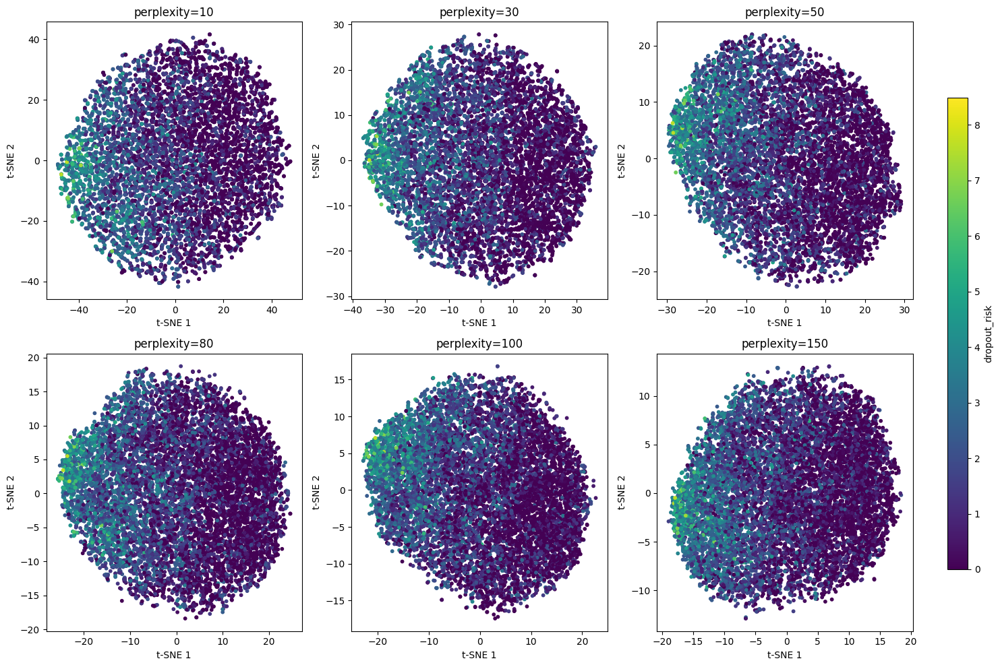

In [ ]:
# ======================= FOR PCA ONLY ======================= #

from sklearn.manifold import TSNE
from tqdm.notebook import tqdm

perplexities = [10, 30, 50, 80, 100, 150]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

scatter_ref = None

for ax, p in tqdm(zip(axes, perplexities), total=len(perplexities)):
    Y = TSNE(
        n_components=2,
        perplexity=p,
        init="random",
        learning_rate="auto",
        random_state=42,
        max_iter=500
    ).fit_transform(X_train_pca_10_sample)

    scatter_ref = ax.scatter(Y[:, 0], Y[:, 1], c=y_train_sample, cmap="viridis", s=10)
    ax.set_title(f"perplexity={p}")
    ax.set_xlabel("t-SNE 1")
    ax.set_ylabel("t-SNE 2")

plt.tight_layout(rect=[0, 0, 0.92, 1])

cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])

fig.colorbar(scatter_ref, cax=cbar_ax, label="dropout_risk")

plt.show()

  0%|          | 0/6 [00:00<?, ?it/s]

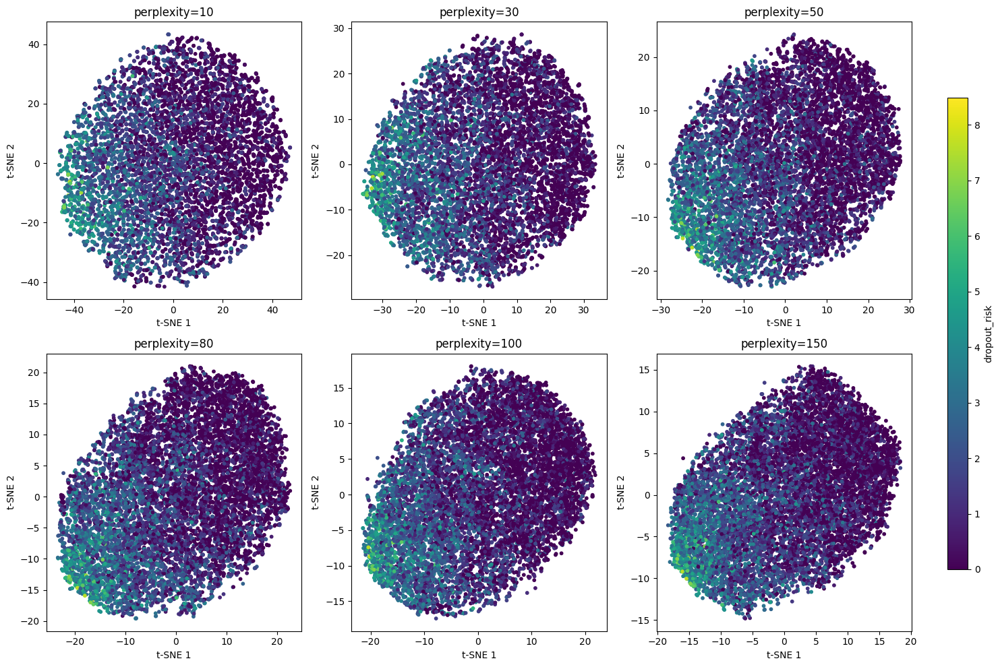

In [ ]:
# ======================= FOR CUSTOM FEATURES ======================= #

perplexities = [10, 30, 50, 80, 100, 150]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

scatter_ref = None

for ax, p in tqdm(zip(axes, perplexities), total=len(perplexities)):
    Y = TSNE(
        n_components=2,
        perplexity=p,
        init="random",
        learning_rate="auto",
        random_state=42,
        max_iter=500
    ).fit_transform(X_train_custom_sample)

    scatter_ref = ax.scatter(Y[:, 0], Y[:, 1], c=y_train_sample, cmap="viridis", s=10)
    ax.set_title(f"perplexity={p}")
    ax.set_xlabel("t-SNE 1")
    ax.set_ylabel("t-SNE 2")

plt.tight_layout(rect=[0, 0, 0.92, 1])

cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])

fig.colorbar(scatter_ref, cax=cbar_ax, label="dropout_risk")

plt.show()

## UMAP

In [ ]:
!pip install umap-learn

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

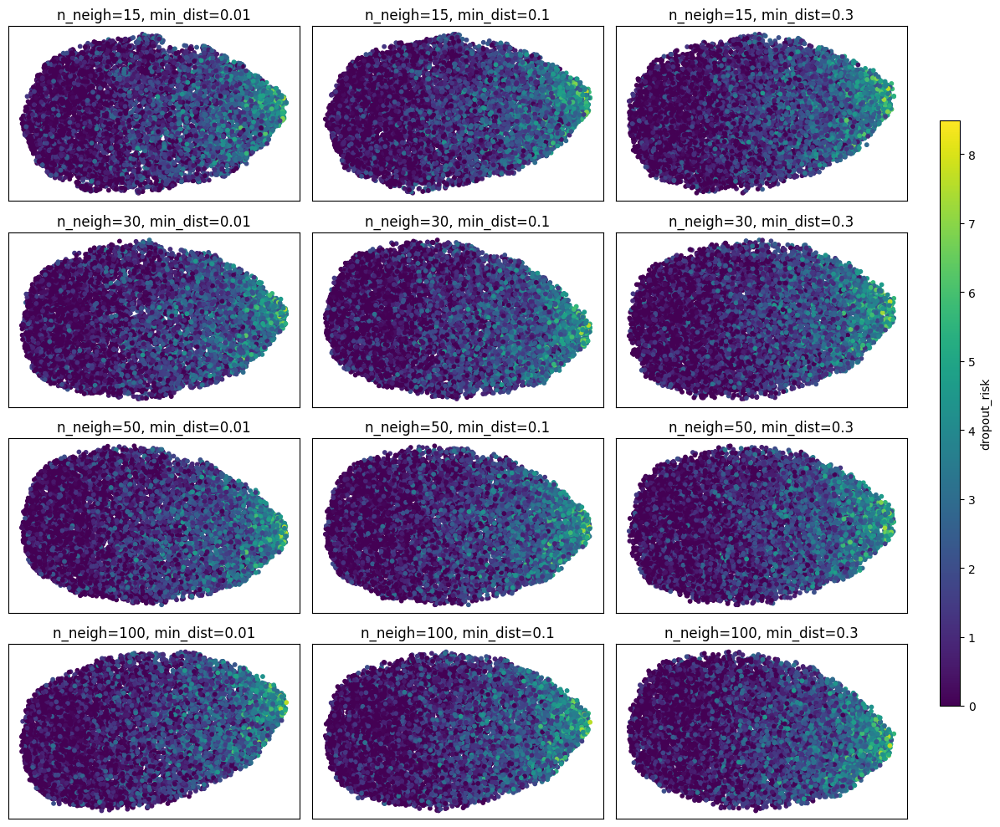

In [ ]:
# ======================= FOR PCA ONLY ======================= #

import umap.umap_ as umap

neighbors_list = [15, 30, 50, 100]
min_dist_list = [0.01, 0.1, 0.3]

fig, axes = plt.subplots(len(neighbors_list), len(min_dist_list),figsize=(12,10))

scatter_ref = None

for i, n in tqdm(enumerate(neighbors_list), total=len(neighbors_list)):
    for j, d in tqdm(enumerate(min_dist_list), total=len(min_dist_list)):

        embedding = umap.UMAP(
            n_neighbors=n,
            min_dist=d,
            n_components=2,
            random_state=42
        ).fit_transform(X_train_pca_10_sample)

        ax = axes[i, j]
        scatter_ref = ax.scatter(embedding[:,0], embedding[:,1],
                   c=y_train_sample, cmap="viridis", s=10)

        ax.set_title(f"n_neigh={n}, min_dist={d}")
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout(rect=[0, 0, 0.92, 1])

cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])

fig.colorbar(scatter_ref, cax=cbar_ax, label="dropout_risk")

plt.show()

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

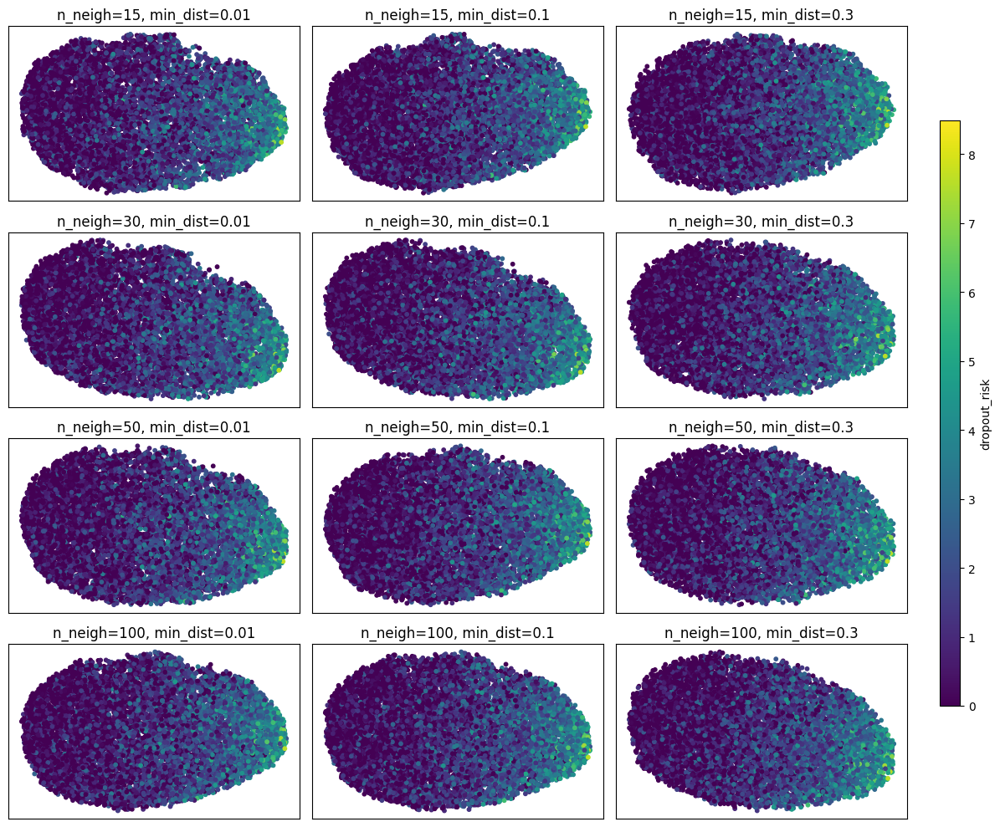

In [ ]:
# ======================= FOR CUSTOM FEATURES ======================= #

neighbors_list = [15, 30, 50, 100]
min_dist_list = [0.01, 0.1, 0.3]

fig, axes = plt.subplots(len(neighbors_list), len(min_dist_list),figsize=(12,10))

scatter_ref = None

for i, n in tqdm(enumerate(neighbors_list), total=len(neighbors_list)):
    for j, d in tqdm(enumerate(min_dist_list), total=len(min_dist_list)):

        embedding = umap.UMAP(
            n_neighbors=n,
            min_dist=d,
            n_components=2,
            random_state=42
        ).fit_transform(X_train_custom_sample)

        ax = axes[i, j]
        scatter_ref = ax.scatter(embedding[:,0], embedding[:,1],
                   c=y_train_sample, cmap="viridis", s=10)

        ax.set_title(f"n_neigh={n}, min_dist={d}")
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout(rect=[0, 0, 0.92, 1])

cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])

fig.colorbar(scatter_ref, cax=cbar_ax, label="dropout_risk")

plt.show()

## kNN

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

kNN_uniform = KNeighborsRegressor(
                n_neighbors=20,
                weights='uniform',
                n_jobs=-1
              )

kNN_uniform.fit(X_train_custom, y_train)

y_pred = kNN_uniform.predict(X_test_custom)

r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

print(f"R² Score: {r2:.3f}")
print(f"MSE:      {mse:.3f}")
print(f"RMSE:     {rmse:.3f}")
print(f"MAE:      {mae:.3f}")


R² Score: 0.591
MSE:      0.740
RMSE:     0.860
MAE:      0.666


In [ ]:
kNN_distance = KNeighborsRegressor(
                n_neighbors=20,
                weights='distance',
                n_jobs=-1
              )

kNN_distance.fit(X_train_custom, y_train)

y_pred = kNN_distance.predict(X_test_custom)

r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

print(f"R² Score: {r2:.3f}")
print(f"MSE:      {mse:.3f}")
print(f"RMSE:     {rmse:.3f}")
print(f"MAE:      {mae:.3f}")

R² Score: 0.591
MSE:      0.740
RMSE:     0.860
MAE:      0.665


In [ ]:
# ================ k selection via CV on a sample of 10000 instances ================ #

from sklearn.model_selection import KFold, cross_val_score

cv = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

k_values = [3, 5, 10, 20, 50, 100, 200, 500]
mean_scores = []
sd_scores = []

for k in k_values:
    fold_scores = cross_val_score(
        KNeighborsRegressor(
                n_neighbors=k,
                weights='distance',
                n_jobs=-1
        ),
        X_train_custom_sample,
        y_train_sample,
        cv=cv,
        scoring='r2'
    )

    mean_scores.append(fold_scores.mean())
    sd_scores.append(fold_scores.std())

best_idx = np.argmax(mean_scores)
best_k = list(k_values)[best_idx]

print(f"Best k: {best_k}")
print(f"Mean CV macro-R2: {mean_scores[best_idx]:.4f}")

Best k: 50
Mean CV macro-R2: 0.5679


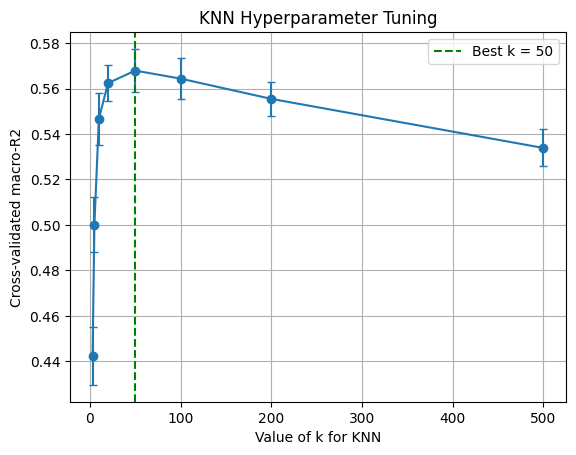

In [ ]:
plt.figure()
plt.errorbar(
    k_values,
    mean_scores,
    yerr=sd_scores,
    marker='o',
    capsize=3
)

plt.axvline(
    best_k,
    linestyle='--',
    label=f'Best k = {best_k}',
    color='green'
)

plt.xlabel('Value of k for KNN')
plt.ylabel('Cross-validated macro-R2')
plt.title('KNN Hyperparameter Tuning')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# -----------------------
# Fit the final model on the full training set
# -----------------------

k_full_values = [50, 75, 100]

for k_curr in k_full_values:
  knn = KNeighborsRegressor(
                n_neighbors=k_curr,
                weights='distance',
                n_jobs=-1
              )
  knn.fit(X_train_custom, y_train)

# -----------------------
# Evaluate on test set
# -----------------------

  y_pred = knn.predict(X_test_custom)

  r2 = r2_score(y_test, y_pred)
  mse = mean_squared_error(y_test, y_pred)
  rmse = np.sqrt(mse)
  mae = mean_absolute_error(y_test, y_pred)

  print(f"k value:  {k_curr}")
  print(f"R² Score: {r2:.3f}")
  print(f"MSE:      {mse:.3f}")
  print(f"RMSE:     {rmse:.3f}")
  print(f"MAE:      {mae:.3f}")
  print("-"*30)

k value:  50
R² Score: 0.602
MSE:      0.720
RMSE:     0.848
MAE:      0.659
------------------------------
k value:  75
R² Score: 0.604
MSE:      0.716
RMSE:     0.846
MAE:      0.659
------------------------------
k value:  100
R² Score: 0.604
MSE:      0.716
RMSE:     0.846
MAE:      0.659
------------------------------


In [ ]:
# -----------------------
# FINAL model on the full training set for k=75
# -----------------------

knn = KNeighborsRegressor(
        n_neighbors=75,
        weights='distance',
        n_jobs=-1
      )
knn.fit(X_train_custom, y_train)

# -----------------------
# Evaluate on test set
# -----------------------

y_pred = knn.predict(X_test_custom)

r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

print(f"R² Score: {r2:.3f}")
print(f"MSE:      {mse:.3f}")
print(f"RMSE:     {rmse:.3f}")
print(f"MAE:      {mae:.3f}")

R² Score: 0.604
MSE:      0.716
RMSE:     0.846
MAE:      0.659


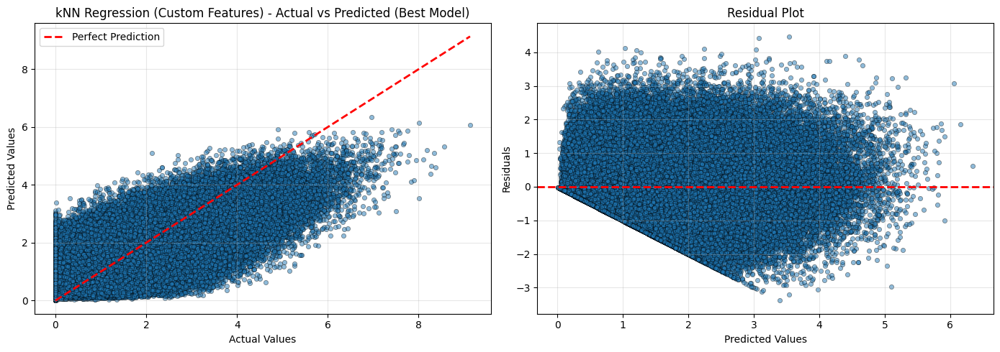

In [ ]:
# Visualizations
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Actual vs Predicted
axes[0].scatter(y_test, y_pred, alpha=0.5, s=20, edgecolors='k', linewidth=0.5)
axes[0].plot([y_test.min(), y_test.max()],
             [y_test.min(), y_test.max()],
             'r--', lw=2, label='Perfect Prediction')
axes[0].set_xlabel('Actual Values')
axes[0].set_ylabel('Predicted Values')
axes[0].set_title('kNN Regression (Custom Features) - Actual vs Predicted (Best Model)')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Residual plot
residuals_custom = y_test.values - y_pred
axes[1].scatter(y_pred, residuals_custom, alpha=0.5, s=20, edgecolors='k', linewidth=0.5)
axes[1].axhline(y=0, color='r', linestyle='--', lw=2)
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residuals')
axes[1].set_title('Residual Plot')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()


In [ ]:
# ================ [V2] k selection via CV on a sample of 10000 instances - only PCs ================ #

from sklearn.model_selection import KFold, cross_val_score

cv = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

k_values = [3, 5, 10, 20, 50, 100, 200, 500]
mean_scores = []
sd_scores = []

for k in k_values:
    fold_scores = cross_val_score(
        KNeighborsRegressor(
                n_neighbors=k,
                weights='distance',
                n_jobs=-1
        ),
        X_train_pca_10_sample,
        y_train_sample,
        cv=cv,
        scoring='r2'
    )

    mean_scores.append(fold_scores.mean())
    sd_scores.append(fold_scores.std())

best_idx = np.argmax(mean_scores)
best_k = list(k_values)[best_idx]

print(f"Best k: {best_k}")
print(f"Mean CV macro-R2: {mean_scores[best_idx]:.4f}")

Best k: 50
Mean CV macro-R2: 0.5656


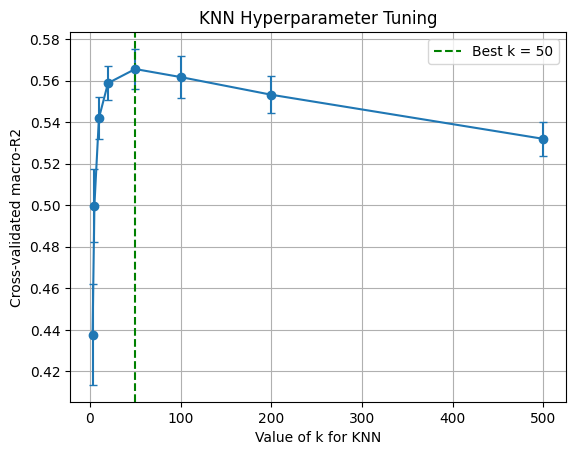

In [ ]:
plt.figure()
plt.errorbar(
    k_values,
    mean_scores,
    yerr=sd_scores,
    marker='o',
    capsize=3
)

plt.axvline(
    best_k,
    linestyle='--',
    label=f'Best k = {best_k}',
    color='green'
)

plt.xlabel('Value of k for KNN')
plt.ylabel('Cross-validated macro-R2')
plt.title('KNN Hyperparameter Tuning')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# -----------------------
# [V2] Fit the final model on the full training set
# -----------------------

k_full_values = [50, 75, 100]

for k_curr in k_full_values:
  knn = KNeighborsRegressor(
                n_neighbors=k_curr,
                weights='distance',
                n_jobs=-1
              )
  knn.fit(X_train_pca_10, y_train)

# -----------------------
# Evaluate on test set
# -----------------------

  y_pred = knn.predict(X_test_pca_10)

  r2 = r2_score(y_test, y_pred)
  mse = mean_squared_error(y_test, y_pred)
  rmse = np.sqrt(mse)
  mae = mean_absolute_error(y_test, y_pred)

  print(f"k value:  {k_curr}")
  print(f"R² Score: {r2:.3f}")
  print(f"MSE:      {mse:.3f}")
  print(f"RMSE:     {rmse:.3f}")
  print(f"MAE:      {mae:.3f}")
  print("-"*30)

k value:  50
R² Score: 0.597
MSE:      0.729
RMSE:     0.854
MAE:      0.663
------------------------------
k value:  75
R² Score: 0.599
MSE:      0.725
RMSE:     0.852
MAE:      0.663
------------------------------
k value:  100
R² Score: 0.599
MSE:      0.724
RMSE:     0.851
MAE:      0.663
------------------------------


## GMM clustering

In [13]:
# 1) Combine train and test PCA data with targets
X_combined_pca = np.vstack([X_train_pca_10, X_test_pca_10])
y_combined = np.concatenate([y_train_continuous.values, y_test_continuous.values])

print(f"Combined dataset shape: {X_combined_pca.shape}")
print(f"Combined target shape: {y_combined.shape}")

# 2) Sample 500 random points
n_samples = min(500, len(X_combined_pca))
random_indices = np.random.choice(len(X_combined_pca), size=n_samples, replace=False)

PC1 = X_combined_pca[random_indices, 0]  # PC1 (first component)
PC3 = X_combined_pca[random_indices, 2]  # PC3 (third component)
PC4 = X_combined_pca[random_indices, 3]  # PC4 (fourth component)

# Combine the full datasets to extract the corresponding sleep_hours and financial_stress
X_combined_full = pd.concat([X_train_full, X_test_full], ignore_index=True)

# Find the column names for sleep hours and financial stress
sleep_col = [col for col in X_combined_full.columns if 'sleep' in col.lower()][0] if any('sleep' in col.lower() for col in X_combined_full.columns) else 'sleep_hours'
financial_col = [col for col in X_combined_full.columns if 'financial' in col.lower()][0] if any('financial' in col.lower() for col in X_combined_full.columns) else 'financial_stress'

# Extract sleep_hours and financial_stress for the sampled indices using iloc
sleep_hours_sampled = X_combined_full.iloc[random_indices][sleep_col].values
financial_stress_sampled = X_combined_full.iloc[random_indices][financial_col].values

Combined dataset shape: (1000000, 10)
Combined target shape: (1000000,)


In [14]:
# 1) Prepare the data: PC1, PC3, PC4, Sleep Hours, Financial Stress
clustering_data = np.column_stack([PC1, PC3, PC4, sleep_hours_sampled, financial_stress_sampled])

print(f"\nRaw data shape: {clustering_data.shape}")
print(f"Features: PC1, PC3, PC4, Sleep Hours, Financial Stress")

# 2) Normalize features (StandardScaler)
scaler = StandardScaler()
clustering_data_normalized = scaler.fit_transform(clustering_data)


Raw data shape: (500, 5)
Features: PC1, PC3, PC4, Sleep Hours, Financial Stress


/tmp/ipykernel_4522/4127766162.py:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', 3);


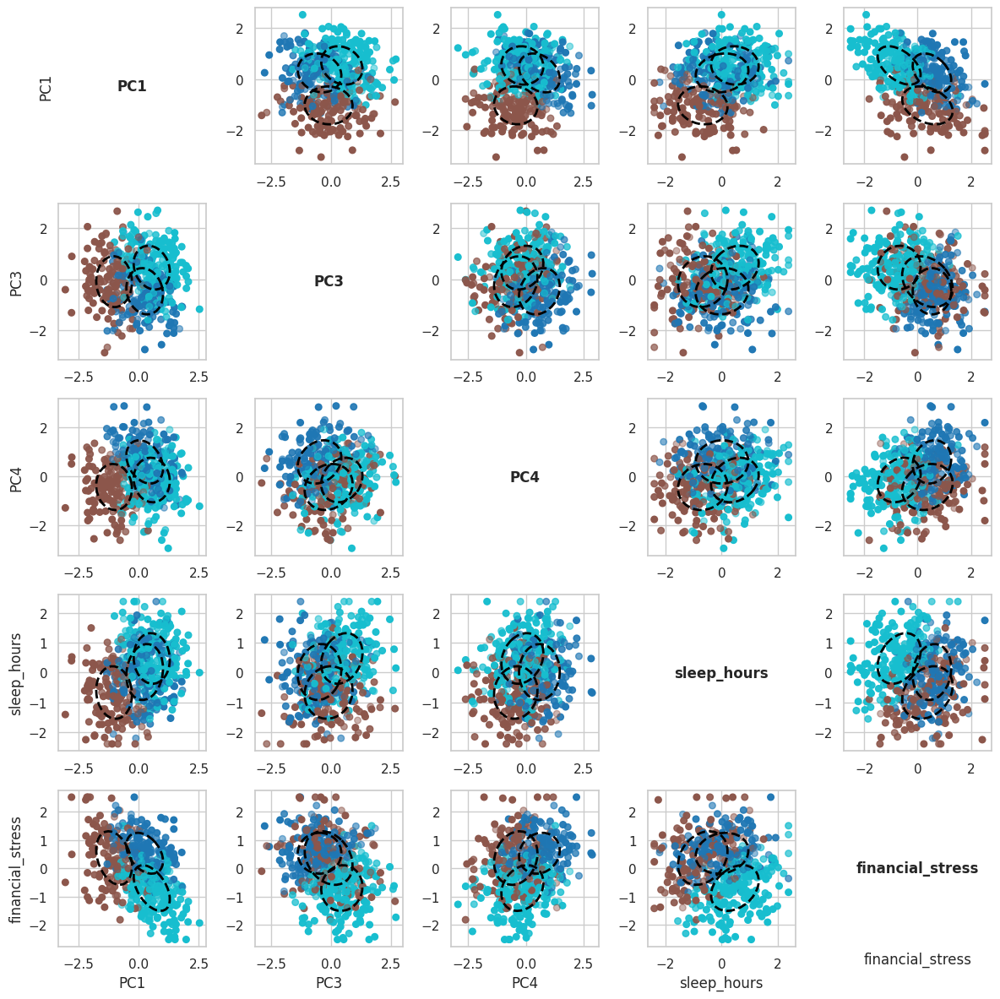

In [17]:
#================== GMM Clustering ==================#
from matplotlib.patches import Ellipse
from sklearn.mixture import GaussianMixture
import matplotlib.cm as cm
from matplotlib.colors import Normalize
import seaborn as sns

def plot_covariance_ellipse(ax, mean, cov, color):
    """Plot a Gaussian covariance ellipse."""
    if cov.shape == (2, 2):  # Full covariance
        U, S, Vt = np.linalg.svd(cov)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(S)  # 2 standard deviations
    else:  # Diagonal covariance
        angle = 0
        width, height = 2 * np.sqrt(cov)

    ellipse = Ellipse(mean, width, height, angle=angle, edgecolor=color, facecolor='none', linestyle='--', linewidth=2)
    ax.add_patch(ellipse)

# Back to df:
clustering_data_normalized = pd.DataFrame(
    clustering_data_normalized,
    columns=['PC1', 'PC3', 'PC4', 'sleep_hours', 'financial_stress']
)

# Fit GMM with 3 clusters
gmm = GaussianMixture(n_components=3, covariance_type='full', random_state=42)
gmm.fit(clustering_data_normalized)

# Predict cluster assignments and probabilities
clusters = gmm.predict(clustering_data_normalized)
probabilities = gmm.predict_proba(clustering_data_normalized)

# Create pairwise scatter plots
sns.set(style="whitegrid");
fig, axes = plt.subplots(5, 5, figsize=(12, 12));
features = clustering_data_normalized.columns
num_features = len(features)
cmap = cm.get_cmap('tab10', 3);

# Loop through feature pairs
for i in range(num_features):
    for j in range(num_features):
        ax = axes[i, j]

        # Diagonal: Show feature names
        if i == j:
            ax.text(0.5, 0.5, features[i], ha='center', va='center', fontsize=12, fontweight='bold')
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_frame_on(False)
        else:
            # Scatter plot
            norm = Normalize(vmin=0, vmax=1)
            colors = np.array([cmap(k) for k in clusters])  # Assign colors based on cluster
            colors[:, -1] = norm(probabilities.max(axis=1))  # Adjust transparency by probability

            ax.scatter(clustering_data_normalized.iloc[:, j], clustering_data_normalized.iloc[:, i], s=30, color=colors)

            # Plot covariance ellipses
            for k in range(gmm.n_components):
                mean = gmm.means_[k][[j, i]]  # Select only relevant dimensions
                cov = gmm.covariances_[k][np.ix_([j, i], [j, i])]  # Extract 2x2 covariance matrix
                plot_covariance_ellipse(ax, mean, cov, color='black')

        # Set labels
        if i == num_features - 1:
            ax.set_xlabel(features[j])
        if j == 0:
            ax.set_ylabel(features[i])

plt.tight_layout()
plt.show()